# Atividade 02 de Aprendizagem de máquina : Classificação com KNN
Aulas referentes aos notebooks das semanas 3 e 4
1. Explore a base de dados. Conheça a distribuição dos atributos de entrada em relação aos atributos de
saída. A partir da exploração é possível ter uma idéia de quais atributos podem conter mais informação
útil para realizar a classificação. Algumas idéias: fazer histogramas pra cada atributo, calcular as
estatísticas descritivas, visualizar o espaço de características plotando pares de atributos, etc.
2. Visualize o espaço formado pelo conjunto de atributos selecionados no passo 1. Use PCA para reduzir
a dimensionalidade.
3. Avalie o desempenho do classificador KNN usando validação cruzada em dois níveis, conforme discutimos
em sala. A validação cruzada no primeiro deve ser em 10 vias, enquanto no segundo nível deve ser em 5
vias. Dica: no primeiro nível você deve usar StratifiedKFold para gerar os particionamentos, e no
segundo nível você deve usar GridSearchCV. A validação cruzada no segundo nível deve selecionar o
melhor k. Utilize a métrica acurácia para avaliar o desempenho do classificador em ambos níveis. Para
avaliar cada particionamento durante a validação cruzada não se esqueça de normalizar os dados de
cada particionamento separadamente.

In [2]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import itertools
from sklearn.model_selection import train_test_split

from pandas.core.common import random_state


## 1. Vamos carregar e investigar a base de dados

In [10]:
df = pd.read_csv('water_potability_nonans.csv')
df.head()

,ph,Hardness,Solids,Chloramines,Sulfate,Conductivity,Organic_carbon,Trihalomethanes,Turbidity,Potability
0,8.316766,214.373394,22018.417441,8.059332,356.886136,363.266516,18.436524,100.341674,4.628771,0
1,9.092223,181.101509,17978.986339,6.546600,310.135738,398.410813,11.558279,31.997993,4.075075,0
2,5.584087,188.313324,28748.687739,7.544869,326.678363,280.467916,8.399735,54.917862,2.559708,0
3,10.223862,248.071735,28749.716544,7.513408,393.663396,283.651634,13.789695,84.603556,2.672989,0
4,8.635849,203.361523,13672.091764,4.563009,303.309771,474.607645,12.363817,62.798309,4.401425,0


In [11]:
#Verificando as médias para os atributos das duas classes
df.groupby('Potability').mean().T

Potability,0,1
ph,7.067201,7.113791
Hardness,196.008440,195.908341
Solids,21628.535122,22344.922883
Chloramines,7.107267,7.174395
Sulfate,333.742928,332.457832
Conductivity,427.554342,425.005423
Organic_carbon,14.400250,14.294764
Trihalomethanes,66.278712,66.581596
Turbidity,3.955181,3.991254


In [46]:
#print(f'Exemplos de água potável : {len(df.loc[df["Potability"]==1])}')
#print(f'Exemplos de água não potável : {len(df.loc[df["Potability"]==0])}')
print(df["Potability"].value_counts())

amostras_potavel=df["Potability"].value_counts()[1]
amostras_nao_potavel=df["Potability"].value_counts()[0]
diferenca=abs(amostras_potavel - amostras_nao_potavel)
print(f"\nVamos subamostrar a maior classe por {diferenca} linhas")

0    1200
1     811
Name: Potability, dtype: int64

Vamos subamostrar a maior classe por 389 linhas


In [44]:
# Realizando a subamostragem da classe "Potability"==0
df_balanceado=df.drop(df[df['Potability']==0].sample(diferenca, random_state=1).index)

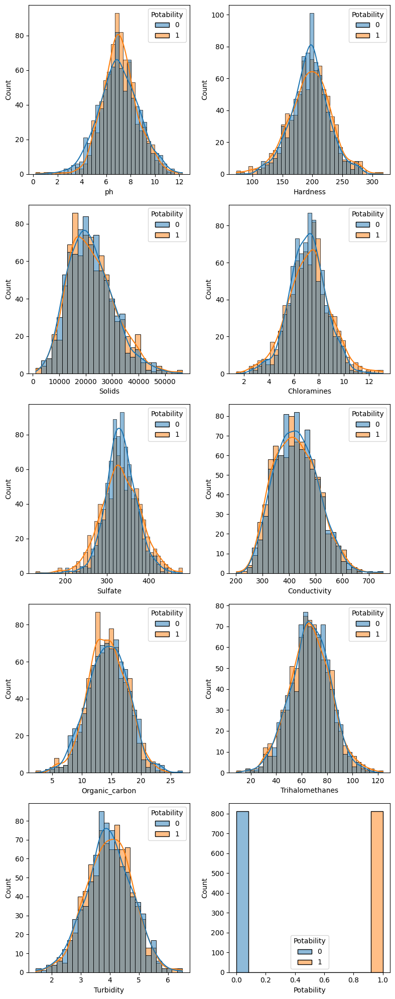

In [45]:
fig, axes = plt.subplots(nrows=5, ncols=2, figsize=(8,20))
for idx, coluna in enumerate(df_balanceado.columns):
  lin = idx//2
  col = idx%2
  sns.histplot(data=df_balanceado,x=coluna, hue='Potability', ax=axes[lin][col],kde=True)
fig.tight_layout()

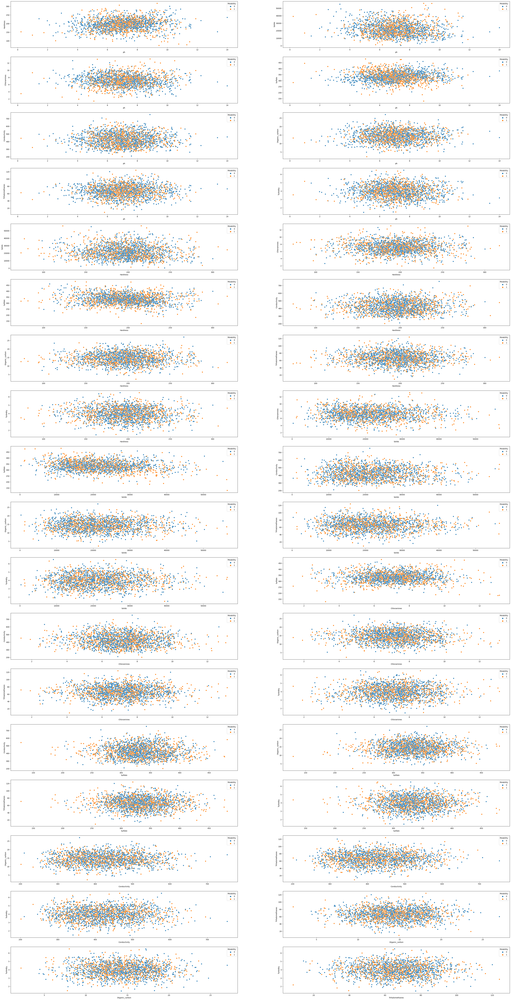

In [47]:
#Vamos fazer o scatterplot de todos os pares atributos para ver como fica a separação das classes
fig, axes = plt.subplots(nrows=18, ncols=2, figsize=(50,100))
cont = 0;

column_combinations = itertools.combinations((df.drop(columns="Potability")).columns, 2)
for column_pair in column_combinations:
  col = cont%2
  lin = cont//2
  coluna  = column_pair[0]
  coluna2 = column_pair[1]
  #print(f"idx = {cont} , linha {lin} coluna {col}, colunas ({coluna},{coluna2})")
  sns.scatterplot(data=df, x=coluna, y=coluna2, hue='Potability', ax=axes[lin][col])

  cont+=1


##Visualizando os dados com PCA
A partir das características mostradas nos gráficos anteriores, observamos que não há nenhuma característica nem par delas que separe claramente os dados. Portantos, vamos selecionar as colunas mais promissoras, e reduzir a dimensionalidade com PCA para visualizar os dados

As melhores características que apresentam menor intersecção de valores entre as amostras de classe "Potável" e "Não potável" são:
* ph
* Hardness
* Sulfate
* Chloramines
* Turbidity

###Normalizando os dados e criando o PCA
Lembrando que é necessário normalizar os dados para o PCA, pois a análise de componentes fica comprometida se a magnitude dos dados for muito diferente.

In [113]:

X = df_balanceado.drop("Potability",axis=1)
y = df_balanceado["Potability"]


In [114]:
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler

#Normalizando os dados
scaler = StandardScaler()
scaler.fit(X)
X_normalizado=scaler.transform(X)

pca = PCA(n_components=2)
pca.fit(X_normalizado)
Xs_pca = pca.transform(X_normalizado)
Xs_pca_df = pd.DataFrame(Xs_pca, columns =["PC0","PC1"])
#Xs_pca_df.head()

<Axes: xlabel='PC0', ylabel='PC1'>

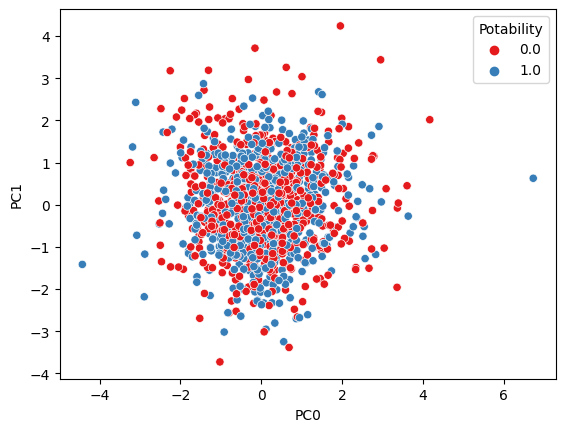

In [115]:
sns.scatterplot(data=Xs_pca_df, x="PC0", y="PC1", hue=y, palette="Set1")

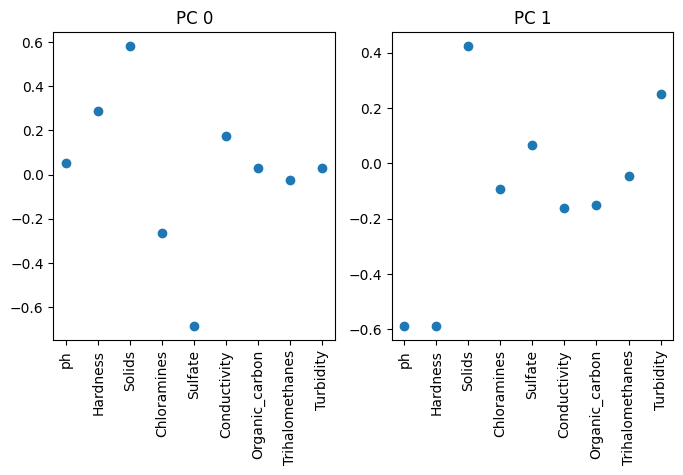

In [116]:
#Visualizando como o PCA atribuiu pesos as características para formar os componentes principais

fig, ax = plt.subplots(nrows=1,ncols=2, figsize=(8,4))
for idx, pc in enumerate(pca.components_):
    ax[idx].scatter(np.arange(len(X.columns)), pc)
    ax[idx].set_xticks(np.arange(len(X.columns)))
    ax[idx].set_xticklabels(X.columns, rotation=90)
    ax[idx].set_title("PC %d" % (idx))
plt.show()

##Treinando KNN
Vamos agora treinar o KNN com dados, usando validação cruzada em dois níveis, 10 vias no primeiro e 5 no segundo.

In [107]:
from sklearn.neighbors import KNeighborsClassifier
from sklearn.model_selection import StratifiedKFold, GridSearchCV
from sklearn.model_selection import train_test_split as tts
from sklearn.metrics import accuracy_score


In [117]:
X_bal = df_balanceado.drop("Potability",axis=1).values
y_bal = df_balanceado["Potability"].values

X=df.drop("Potability",axis=1).values
y=df["Potability"].values

X_pca = Xs_pca_df.values
y_pca = y_bal


In [118]:
def otimiza_dois_niveis(X,y):
  kparticoes = 10
  kparticoes2 = 5

  acuracias = []

  skf = StratifiedKFold(n_splits=kparticoes, shuffle=True,
                          random_state=1)

  for idx_treino, idx_teste in skf.split(X, y):

      X_treino = X[idx_treino]
      y_treino = y[idx_treino]

      X_teste = X[idx_teste]
      y_teste = y[idx_teste]

      scaler = StandardScaler()
      scaler.fit(X_treino)
      X_treino = scaler.transform(X_treino)
      X_teste = scaler.transform(X_teste)

      params = { "n_neighbors" : range(1,30,2) }
      knn = KNeighborsClassifier()
      knn = GridSearchCV(knn, params,
                        cv=StratifiedKFold(kparticoes2))

      knn.fit(X_treino, y_treino)

      acuracias.append(accuracy_score(y_teste,
                                      knn.predict(X_teste)))

  print(f"min: {min(acuracias):.2f}, max: {max(acuracias):.2f}, avg +- std: {np.mean(acuracias):.2f} +- {np.std(acuracias):.2f}" )

### Realizando alguns testes
Vamos treinar o KNN com diferentes dados e observar os resultados.
* Primeiro, com a base de dados inteira, desbalanceada
* Segundo, com a base de dados balanceada
* Terceiro,  com a base de dados balanceada redução a duas características com PCA

In [123]:
otimiza_dois_niveis(X,y)

min: 0.63, max: 0.67, avg +- std: 0.65 +- 0.01


In [124]:
otimiza_dois_niveis(X_bal,y_bal)

min: 0.53, max: 0.63, avg +- std: 0.59 +- 0.03


In [125]:
otimiza_dois_niveis(X_pca,y_pca)

min: 0.48, max: 0.58, avg +- std: 0.54 +- 0.03


###Conclusões
* Com a base de dados completa obtivemos a melhor média e o maior tempo de treinamento (18s).
* Com a base de dados balanceada por subamostragem, houve reduçao na taxa de acerto, no tempo de treinamento (15s).
* Com os dados reduzidos a duas dimensões e balanceados obtivemos o menor tempo de treinamento (11s) porém as piores taxas de acerto.


Não obtemos um bom resultado com esse algoritmo em nenhum dos casos.